# Pix2Pix

### Import libraries

In [1]:
import os
import cv2
import time
import pathlib
import datetime
import numpy as np
import tensorflow as tf
from IPython import display
from tensorflow.keras import *
from matplotlib import pyplot as plt
from tensorflow.keras.layers import *

AUTOTUNE = tf.data.AUTOTUNE

2024-10-17 14:55:28.096025: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-17 14:55:28.096125: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-17 14:55:28.230551: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Dataset

Define a function for downloading the ```maps``` datset from [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/).

In [2]:
def get_dataset(dataset_name, ind):
    '''
    Function for downloading datset

    arguments: dataset_name(str)

    returns: path(str), num_train_image(int), train_path(str), valid_path(str)
    '''
    url = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

    path_to_zip = tf.keras.utils.get_file(fname=f"{dataset_name}.tar.gz",
                                          origin=url,
                                          extract=True)

    path_to_zip = pathlib.Path(path_to_zip)

    path = path_to_zip.parent/dataset_name

    num_train_images = len(os.listdir(os.path.join(list(path.parent.iterdir())[ind], 'train')))
    train_path = os.path.join(list(path.parent.iterdir())[ind], 'train')
    valid_path = os.path.join(list(path.parent.iterdir())[ind], 'val')

    return path, num_train_images, train_path, valid_path

In [3]:
dataset_name = "maps"

In [4]:
maps_path, num_map_images, train_path, valid_path = get_dataset(dataset_name, 1)

250242400/250242400 ━━━━━━━━━━━━━━━━━━━━ 42s 0us/step


Show 3 random images from the train dtaset:

In [5]:
num_samples = 3

In [6]:
np.random.seed(42)
indices = np.random.choice(num_map_images, num_samples)

In [7]:
def display_samples(indices, path):
    plt.figure(figsize=(20, 10))

    for ind in range(3):
        sample = tf.io.read_file(str(path / f'train/{indices[ind]}.jpg'))
        sample = tf.io.decode_jpeg(sample)
        plt.subplot(1, 3, ind+1)
        plt.imshow(sample)
    plt.show()

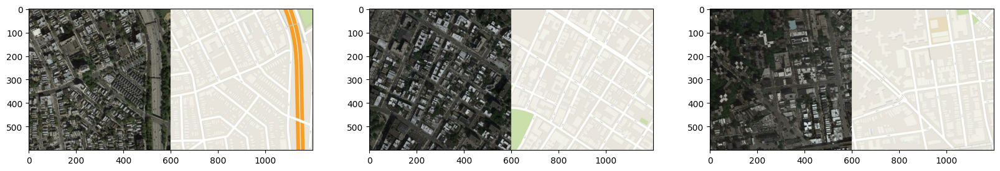

In [8]:
display_samples(indices, maps_path)

Let's do the image preprocessing now. for this, we implement the below steps:
- Normalization: Normalize image to [-1, 1]
- Resizong: Resize images to IMG_HEIGHT * IMG_WIDTH(256 * 256)
- Splitting: Split images to two parts, input and label.

In [9]:
def normalize(input_image, real_image):
    '''
    Function for normalizing the images to [-1, 1]

    arguments: input_image(tensor), real_image(tensor)

    returns: input_image(tensor), real_image(tensor)
    '''
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [10]:
def resize(input_image, real_image, height, width):
    '''
    Function for resizing images to IMG_WIDTH * IMG_HEIGHT

    arguments: input_image(tensor), real_image(tensor), height(int), width(int)

    returns: input_image(tensor), real_image(tensor)
    '''
    input_image = tf.image.resize(input_image, [height, width],
                              method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image  = tf.image.resize(real_image, [height, width],
                              method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

Set some hyperparameters first:

In [11]:
BUFFER_SIZE = num_map_images
BATCH_SIZE  = 1
IMG_WIDTH   = 256
IMG_HEIGHT  = 256
CHANNELS = 3

In [12]:
def split_image(image_file):
    '''
    Function to read and decode an image file to a uint8 tensor,
    split each image tensor into two tensors:
    - an input image
    - a real image, and
    convert both images to float32 tensors
    '''
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image, channels=CHANNELS)
    image = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH * 2))

    input_image, real_image = normalize(image[:, :IMG_WIDTH], image[:, IMG_WIDTH:])

    input_image = tf.cast(input_image, tf.float32)
    real_image  = tf.cast(real_image,  tf.float32)
    return input_image, real_image


Now, define a datset generator which returns tran and validation datsets.

In [13]:
def generate_dataset(path, train_dataset, val_dataset):
    '''
    Function for generating train and validation datasets

    arguments: path(str)

    returns: train_datset(dataset), val_dataset(dataset)
    '''
    train_dataset = train_dataset.map(split_image,
                                    num_parallel_calls=AUTOTUNE)
    train_dataset = train_dataset.shuffle(BUFFER_SIZE)
    train_dataset = train_dataset.batch(BATCH_SIZE)

    val_dataset = val_dataset.map(split_image)
    val_dataset = val_dataset.batch(BATCH_SIZE)

    return train_dataset, val_dataset

In [14]:
train_dataset = tf.data.Dataset.list_files(str(maps_path / 'train/*.jpg'))
val_dataset   = tf.data.Dataset.list_files(str(maps_path / 'val/*.jpg'))

In [15]:
print(tf.data.experimental.cardinality(train_dataset).numpy())
print(tf.data.experimental.cardinality(val_dataset).numpy())

1096
1098


In [16]:
train_dataset, val_dataset = generate_dataset(maps_path, train_dataset, val_dataset)

In [17]:
initializer = tf.keras.initializers.RandomNormal(stddev=0.02)

## Generator

In this section, the GENERATOR in ```Pix2Pix``` archtecture is implemented. This part of the architecture is like a U-Net. So, it has two parts, downsampling and upsampling:

In [18]:
def Generator(input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)):

    inputs = Input(shape=input_shape)

    def downsample(inputs, filters, batch_norm=True):
        layer = Conv2D(filters, (4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(inputs)
        if batch_norm:
            layer = BatchNormalization()(layer, training=True)
        layer = LeakyReLU(alpha=0.2)(layer)
        return layer

    def upsample(inputs, skip, filters, dropout=True):
        layer = Conv2DTranspose(filters, (4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(inputs)
        layer = BatchNormalization()(layer, training=True)
        if dropout:
            layer = Dropout(0.5)(layer, training=True)
        layer = Concatenate()([layer, skip])
        layer = Activation('relu')(layer)
        return layer


    down1 = downsample(inputs, 64, batch_norm=False)
    down2 = downsample(down1, 128)
    down3 = downsample(down2, 256)
    down4 = downsample(down3, 512)
    down5 = downsample(down4, 512)
    down6 = downsample(down5, 512)
    down7 = downsample(down6, 512)

    buttleneck = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(down7)
    buttleneck = ReLU()(buttleneck)

    up1 = upsample(buttleneck, down7, 512)
    up2 = upsample(up1, down6, 512)
    up3 = upsample(up2, down5, 512)
    up4 = upsample(up3, down4, 512, dropout=False)
    up5 = upsample(up4, down3, 256, dropout=False)
    up6 = upsample(up5, down2, 128, dropout=False)
    up7 = upsample(up6, down1, 64, dropout=False)

    output = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(up7)
    output = tf.keras.activations.tanh(output)

    model = Model(inputs, output)
    return model

generator = Generator((IMG_HEIGHT ,IMG_WIDTH, CHANNELS))
generator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      3,136 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │    131,200 │ leaky_re_lu[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        512 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │    524,544 │ leaky_re_lu_1[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │  2,097,664 │ leaky_re_lu_2[0]… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      2,048 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 8, 8, 512) │  4,194,816 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 4, 4, 512) │  4,194,816 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 4, 4, 512) │      2,048 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 54,429,315 (207.63 MB)

 Trainable params: 54,419,459 (207.59 MB)

 Non-trainable params: 9,856 (38.50 KB)

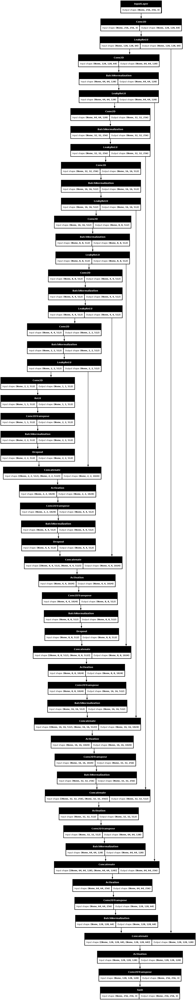

In [19]:
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Also, there is a DISCRIMINATOR in GAN models. In this section, this part of ```Pix2Pix``` model is implemneted.

In [20]:
def Discriminator(image_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)):
    image = Input(shape=image_shape)
    target = Input(shape=image_shape)

    concat = Concatenate()([image, target])

    layer = Conv2D(64, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(concat)
    layer = LeakyReLU(alpha=0.2)(layer)

    layer = Conv2D(128, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(layer)
    layer = BatchNormalization()(layer)
    layer = LeakyReLU(alpha=0.2)(layer)

    layer = Conv2D(256, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(layer)
    layer = BatchNormalization()(layer)
    layer = LeakyReLU(alpha=0.2)(layer)

    layer = Conv2D(512, kernel_size=(4,4), strides=(2,2), padding='same', kernel_initializer=initializer)(layer)
    layer = BatchNormalization()(layer)
    layer = LeakyReLU(alpha=0.2)(layer)

    layer = Conv2D(1, kernel_size=(4,4), padding='same', kernel_initializer=initializer)(layer)
    layer = Activation('sigmoid')(layer)

    model = Model([image, target], layer)
    return model

discriminator = Discriminator((IMG_HEIGHT, IMG_WIDTH, CHANNELS))
discriminator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_layer_1[0]… │
│ (Concatenate)       │ 6)                │            │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 128, 128,  │      6,208 │ concatenate_7[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_7       │ (None, 128, 128,  │          0 │ conv2d_8[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │    131,200 │ leaky_re_lu_7[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_8       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 32, 32,    │    524,544 │ leaky_re_lu_8[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_9       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 16, 16,    │  2,097,664 │ leaky_re_lu_9[0]… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_10      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 16, 16, 1) │      8,193 │ leaky_re_lu_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 16, 16, 1) │          0 │ conv2d_12[0][0]   │
│ (Activation)        │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,771,393 (10.57 MB)

 Trainable params: 2,769,601 (10.57 MB)

 Non-trainable params: 1,792 (7.00 KB)

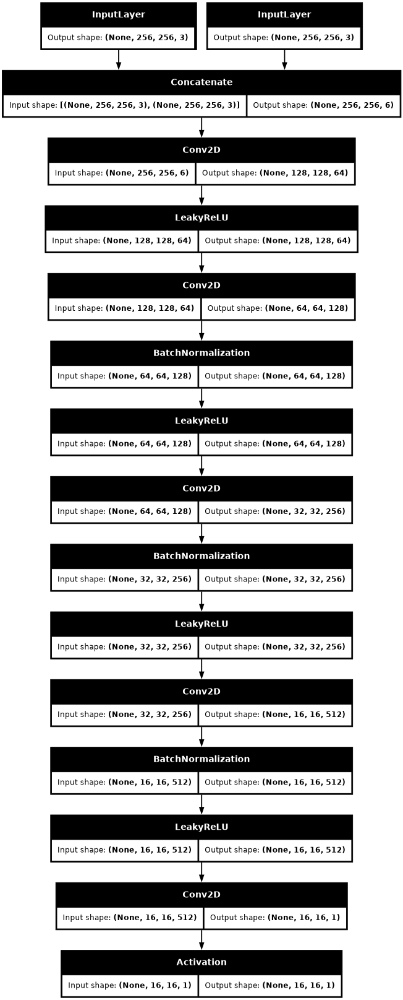

In [21]:
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Set optimizers for both the generator and the discriminator.

In [22]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002,
                                                  beta_1=0.5,
                                                  beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002,
                                                  beta_1=0.5,
                                                  beta_2=0.999)

## Loss function
{$G^* = arg\;\underset{G}{min}\;\underset{D}{max} \mathbb{\mathcal{L}}_{cGAN} (G, D) + \lambda \mathbb{\mathcal{L}}_{L1}(G)$

### Generator loss


In [23]:
LAMBDA = 100

In [24]:
BCE_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
MAE = tf.keras.losses.MeanAbsoluteError()

In [25]:
def generator_loss(disc_generated_output, gen_output, target):
    '''
    Function for calculationg generator loss

    arguments: disc_generated_output(tensor), gen_output(tensor), target(tensor)

    returns: total_gen_loss(float), gan_loss(float), l1_loss(float)
    '''
    gan_loss = BCE_loss(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = MAE(target, gen_output)
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

### Discriminator loss


In [26]:
def discriminator_loss(disc_real_output, disc_generated_output):
    '''
    Function for calculationg discriminator loss

    arguments: disc_real_output(tensor), disc_generated_output(tensor)

    returns: total_disc_loss(float)
    '''
    real_loss = BCE_loss(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = BCE_loss(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

### Training proces
In this section, the training process is implemented. For each image in train datset, we give the input and the target(label) image, take a train step, and compute the losses.

In [27]:
@tf.function
def train_step(input_image, target):
    '''
    Function for implementing a training step

    arguments: input_image(tensor), target(tensor), step(int)

    returns: None
    '''
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      # Generate image
        gen_output = generator(input_image, training=True)

        # Pass real image label to the discriminator
        disc_real_output = discriminator([input_image, target], training=True)

        # Pass generated image to the discriminator
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # Calculate generator and discriminator losses
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Calculate gradient
    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Optimization
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))


    return gen_total_loss, disc_loss

Define a function to generate and plot images during training process.

In [28]:
def denormalize(img):
    img = (img + 1) * 127.5
    return img

In [29]:
def generate_and_plot_images(generator, selected_images):
    '''
    Function to generate and plot images

    arguments: generator(Model), selected_images(list of images)
    '''
    fig, axes = plt.subplots(1, 3, figsize=(8, 8))
    axes = axes.flatten()

    for i, (input_image, target) in enumerate(selected_images):
        generated_image = generator(input_image, training=False)

        input_image = input_image.numpy().squeeze()
        target = target.numpy().squeeze()
        generated_image = generated_image.numpy().squeeze()

        axes[3*i].imshow(denormalize(input_image).astype('uint8'))
        axes[3*i].axis('off')
        if i == 0:
            axes[3*i].set_title('Input Image')

        axes[3*i+1].imshow(denormalize(target).astype('uint8'))
        axes[3*i+1].axis('off')
        if i == 0:
            axes[3*i+1].set_title('Ground Truth')

        axes[3*i+2].imshow(denormalize(generated_image).astype('uint8'))
        axes[3*i+2].axis('off')
        if i == 0:
            axes[3*i+2].set_title('Generated Image')

    plt.tight_layout()
    plt.show()

In [30]:
generator_losses = []
discriminator_losses = []
batch_gen_losses = []
batch_disc_losses = []
mean_1 = []
mean_2 = []
EPOCHS = 20

/opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/nn.py:681: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2024-10-17 14:56:49.937431: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epochs:1 Generator loss: 14.9519 --- Discriminator loss: 1.6355


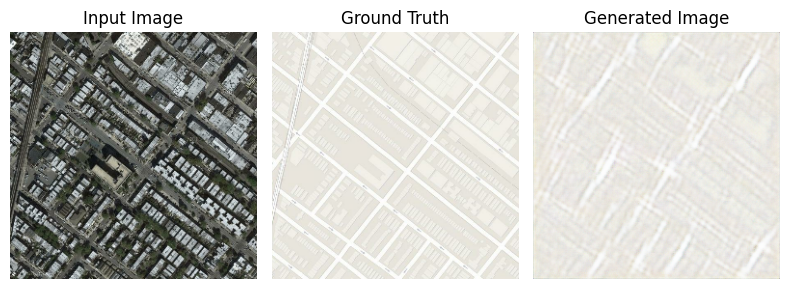

Epochs:2 Generator loss: 7.8099 --- Discriminator loss: 1.1945


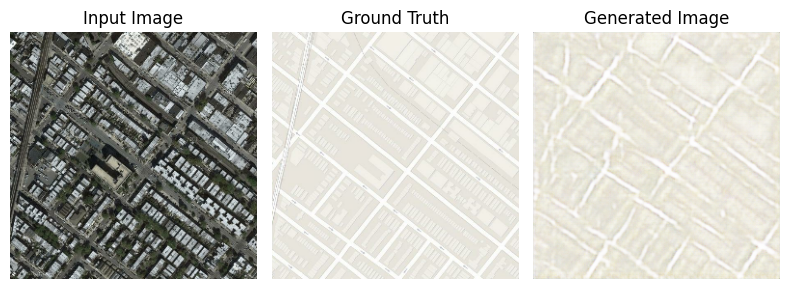

Epochs:3 Generator loss: 11.1540 --- Discriminator loss: 0.7420


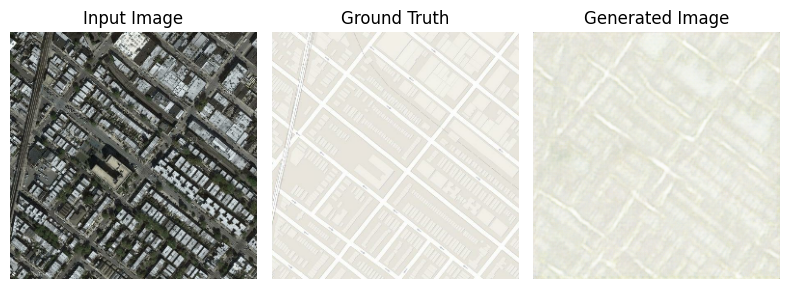

Epochs:4 Generator loss: 14.0262 --- Discriminator loss: 0.7495


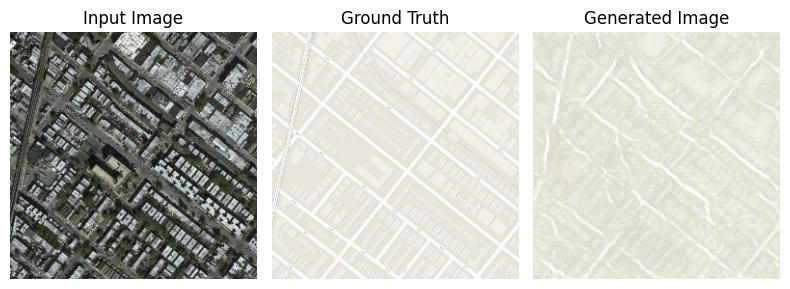

Epochs:5 Generator loss: 8.9918 --- Discriminator loss: 0.4933


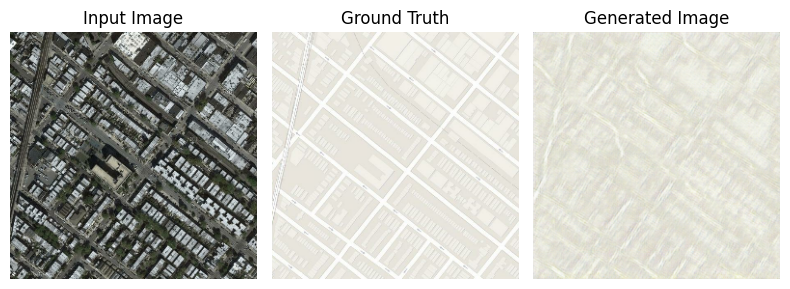

Epochs:6 Generator loss: 12.1673 --- Discriminator loss: 0.6112


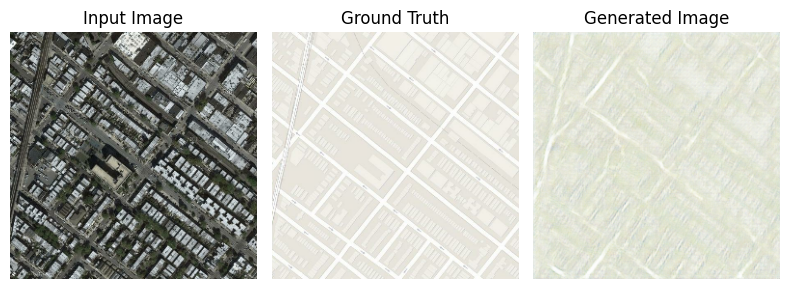

Epochs:7 Generator loss: 12.9656 --- Discriminator loss: 0.1779


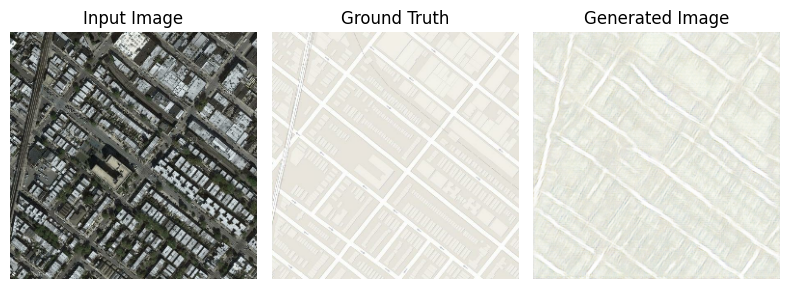

Epochs:8 Generator loss: 7.5332 --- Discriminator loss: 0.3282


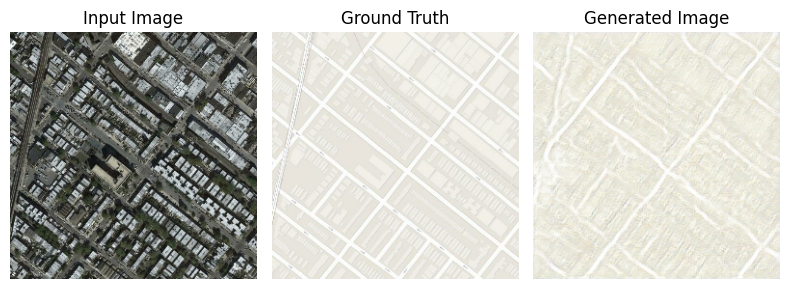

Epochs:9 Generator loss: 6.8810 --- Discriminator loss: 0.6248


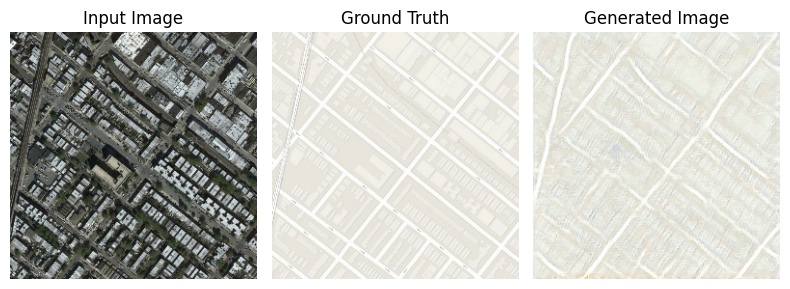

Epochs:10 Generator loss: 12.6410 --- Discriminator loss: 0.1126


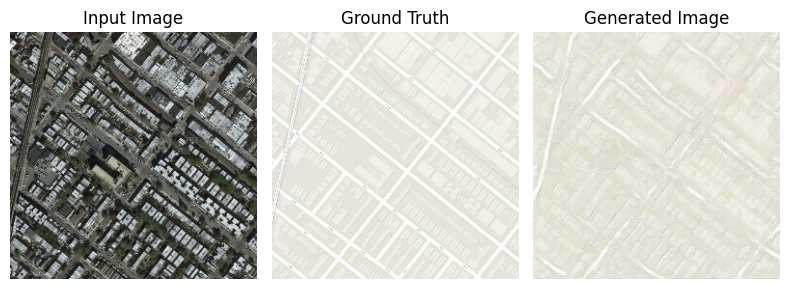

Epochs:11 Generator loss: 13.7575 --- Discriminator loss: 0.1547


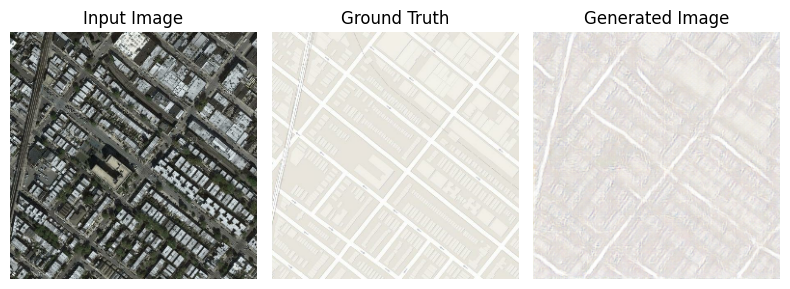

Epochs:12 Generator loss: 10.1556 --- Discriminator loss: 0.2184


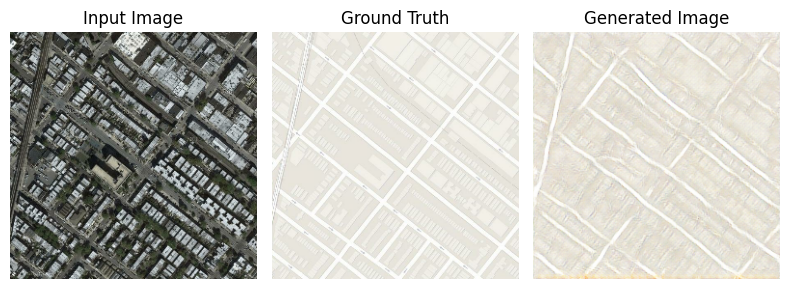

Epochs:13 Generator loss: 11.8119 --- Discriminator loss: 0.2014


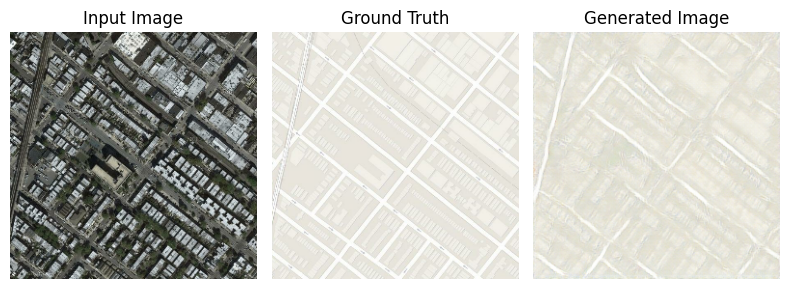

Epochs:14 Generator loss: 5.8945 --- Discriminator loss: 0.0872


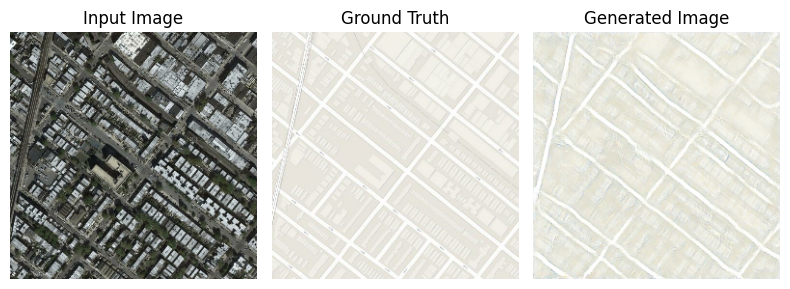

Epochs:15 Generator loss: 12.1305 --- Discriminator loss: 0.3630


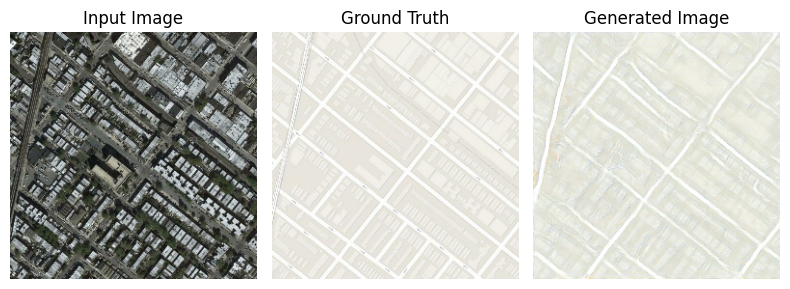

Epochs:16 Generator loss: 7.8988 --- Discriminator loss: 0.4851


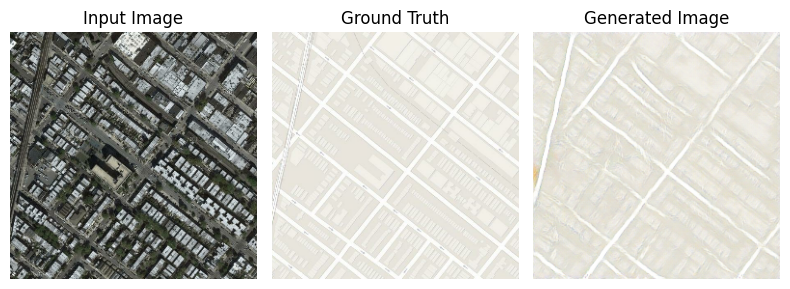

Epochs:17 Generator loss: 7.8542 --- Discriminator loss: 0.3595


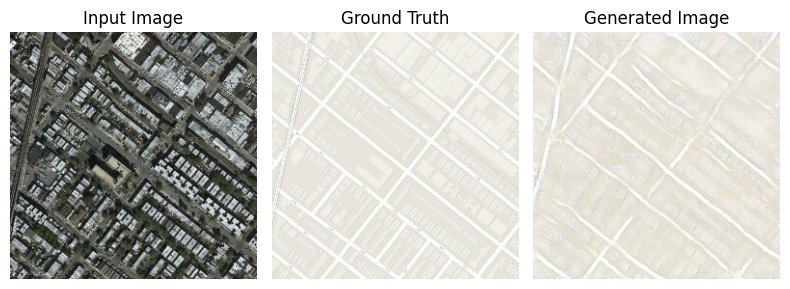

Epochs:18 Generator loss: 5.7796 --- Discriminator loss: 0.8892


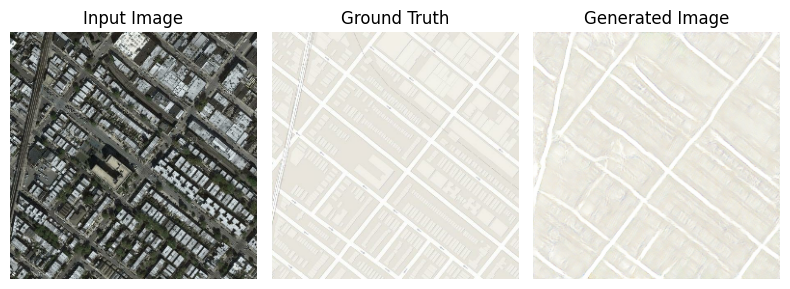

Epochs:19 Generator loss: 6.3502 --- Discriminator loss: 0.2408


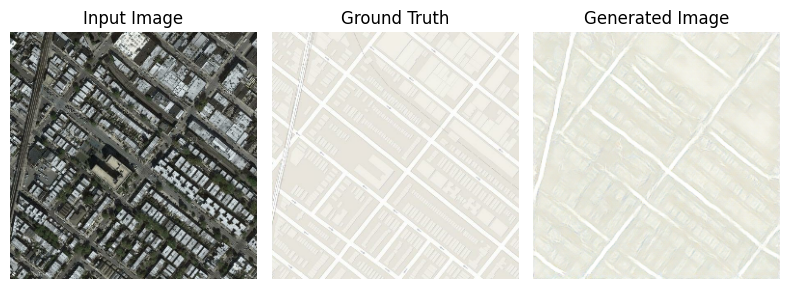

Epochs:20 Generator loss: 7.5981 --- Discriminator loss: 0.2924


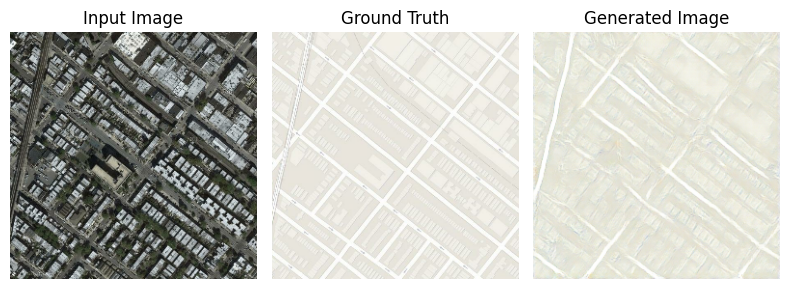

In [31]:
selected_images = list(val_dataset.take(1))

# Training loop
for epoch in range(EPOCHS):
    for sat_img, map_img in train_dataset.take(num_map_images):
        gen_loss, disc_loss = train_step(sat_img, map_img)
        generator_losses.append(gen_loss)
        discriminator_losses.append(disc_loss)

    mean_1.append(np.mean(generator_losses[-1 * num_map_images - 1:]))
    mean_2.append(np.mean(discriminator_losses[-1 * num_map_images - 1:]))
    batch_gen_losses.append(gen_loss)
    batch_disc_losses.append(disc_loss)
    print(f"Epochs:{epoch+1} Generator loss: {gen_loss:.4f} --- Discriminator loss: {disc_loss:.4f}")

    generate_and_plot_images(generator, selected_images)

### Plots

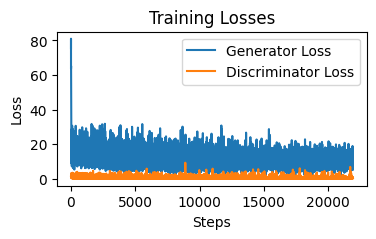

In [32]:
plt.figure(figsize=(4, 2))
plt.plot(generator_losses, label='Generator Loss')
plt.plot(discriminator_losses, label='Discriminator Loss')
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.legend()
plt.show()

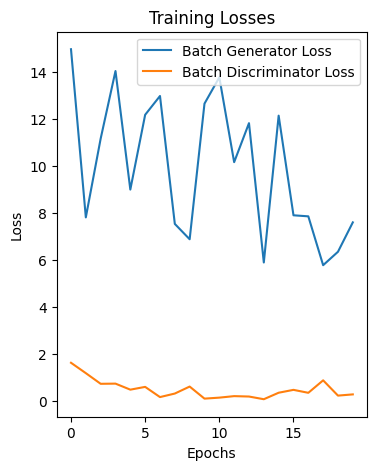

In [33]:
plt.figure(figsize=(4, 5))
plt.plot(batch_gen_losses, label='Batch Generator Loss')
plt.plot(batch_disc_losses, label='Batch Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.legend()
plt.show()

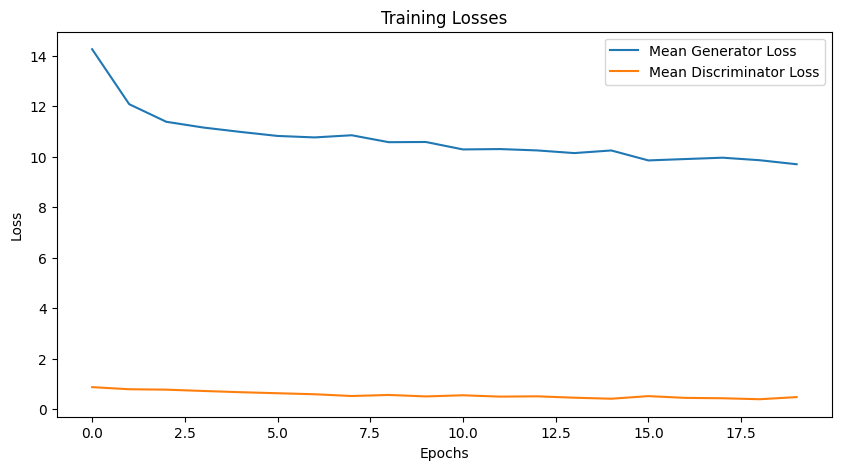

In [34]:
plt.figure(figsize=(10, 5))
plt.plot(mean_1, label='Mean Generator Loss')
plt.plot(mean_2, label='Mean Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.legend()
plt.show()